In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np

In [2]:
from tf_agents.environments import suite_atari
from tf_agents.environments.atari_preprocessing import AtariPreprocessing
from tf_agents.environments.atari_wrappers import FrameStack4
from tf_agents.environments.wrappers import ActionRepeat
from functools import partial


class AtariPreprocessingWithSkipStart(AtariPreprocessing):
    def __init__(self, *kwargs):
        super().__init__(frame_skip=3, *kwargs)
    def skip_frames(self, num_skip):
        for _ in range(num_skip):
          super().step(0)
    def reset(self, **kwargs):
        obs = super().reset(**kwargs)
        self.skip_frames(30)
        return obs
    def step(self, action):
        lives_before_action = self.ale.lives()
        obs, rewards, done, info = super().step(action)
        if self.ale.lives() < lives_before_action and not done:
            self.skip_frames(30)
        return obs, rewards, done, info

env = suite_atari.load(
    "SpaceInvaders-v4",
    gym_env_wrappers=[AtariPreprocessingWithSkipStart, FrameStack4],
    env_wrappers=[partial(ActionRepeat, times=4)],
)

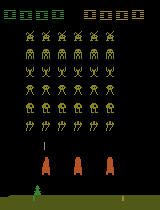

In [3]:
import PIL

env.reset()
PIL.Image.fromarray(env.render())

In [4]:
env.unwrapped.get_action_meanings()

['NOOP', 'FIRE', 'RIGHT', 'LEFT', 'RIGHTFIRE', 'LEFTFIRE']

In [5]:
from tf_agents.environments.tf_py_environment import TFPyEnvironment

tf_env = TFPyEnvironment(env)

In [6]:
from tf_agents.networks.q_network import QNetwork
from tf_agents.agents.dqn.dqn_agent import DqnAgent

preprocessing_layers = keras.layers.Lambda(lambda obs: tf.cast(obs, np.float32) / 255.)
conv_layer_params = [(6, 8, 4), (36, 4, 2), (36, 4, 1)]
fc_layer_params = [6*6*6]

q_net = QNetwork(
    tf_env.observation_spec(),
    tf_env.action_spec(),
    preprocessing_layers=preprocessing_layers,
    conv_layer_params=conv_layer_params,
    fc_layer_params=fc_layer_params,
)

train_step = tf.Variable(0)
update_period = 4
optimizer = keras.optimizers.RMSprop(learning_rate=2.5e-4, rho=0.95, momentum=0.0, epsilon=1e-4, centered=True)
epsilon_fn = keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate=1.0,
    decay_steps=250000 // update_period,
    end_learning_rate=0.01
)

agent = DqnAgent(
    tf_env.time_step_spec(),
    tf_env.action_spec(),
    q_network=q_net,
    optimizer=optimizer,
    target_update_period=2000,
    td_errors_loss_fn=keras.losses.Huber(reduction="none"),
    gamma=0.99,
    train_step_counter=train_step,
    epsilon_greedy=lambda: epsilon_fn(train_step)
)

agent.initialize()

In [7]:
from tf_agents.replay_buffers import tf_uniform_replay_buffer

replay_buffer = tf_uniform_replay_buffer.TFUniformReplayBuffer(
    data_spec=agent.collect_data_spec,
    batch_size=tf_env.batch_size,
    max_length=500000,
)

replay_buffer_observer = replay_buffer.add_batch

In [8]:
class ShowProgress:
    def __init__(self, total):
        self.counter = 0
        self.total = total
    
    def __call__(self, trajectory):
        if not trajectory.is_boundary():
            self.counter += 1
        if self.counter % 100 == 0:
            print(f"\r{self.counter} / {self.total}", end="")

In [9]:
from tf_agents.metrics import tf_metrics

train_metrics=[ 
    tf_metrics.NumberOfEpisodes(),
    tf_metrics.EnvironmentSteps(),
    tf_metrics.AverageReturnMetric(),
    tf_metrics.AverageEpisodeLengthMetric(),
]

In [10]:
from tf_agents.eval.metric_utils import log_metrics
import logging
logging.getLogger().setLevel(logging.INFO)
log_metrics(train_metrics)

INFO:absl: 
		 NumberOfEpisodes = 0
		 EnvironmentSteps = 0
		 AverageReturn = 0.0
		 AverageEpisodeLength = 0.0


In [11]:
from tf_agents.drivers.dynamic_step_driver import DynamicStepDriver

collect_driver = DynamicStepDriver(
    tf_env,
    agent.collect_policy,
    observers=[replay_buffer_observer] + train_metrics,
    num_steps=update_period,
)

In [12]:
from tf_agents.policies.random_tf_policy import RandomTFPolicy

initial_collect_policy = RandomTFPolicy(tf_env.time_step_spec(), tf_env.action_spec())
init_driver = DynamicStepDriver(
    tf_env,
    initial_collect_policy,
    observers=[replay_buffer.add_batch, ShowProgress(10000)],
    num_steps=10000
)
final_time_step, final_policy_state = init_driver.run()

10000 / 10000

In [13]:
trajectories, buffer_info = next(iter(replay_buffer.as_dataset(
    sample_batch_size=2,
    num_steps=3,
    single_deterministic_pass=False
)))

Instructions for updating:
Use `as_dataset(..., single_deterministic_pass=False) instead.


Instructions for updating:
Use `as_dataset(..., single_deterministic_pass=False) instead.


In [14]:
dataset = replay_buffer.as_dataset(
    sample_batch_size=64,
    num_steps=2,
    num_parallel_calls=3
).prefetch(3)

In [15]:
from tf_agents.utils.common import function

collect_driver.run = function(collect_driver.run)
agent.train = function(agent.train)

In [16]:
def train_agent(n_iterations):
    time_step = None
    policy_state = agent.collect_policy.get_initial_state(tf_env.batch_size)
    iterator = iter(dataset)
    for iteration in range(n_iterations):
        time_step, policy_state = collect_driver.run(time_step, policy_state)
        trajectories, buffer_info = next(iterator)
        train_loss = agent.train(trajectories)
        print(f"\r{iteration} loss:{train_loss.loss.numpy():.5f}", end="")
        if iteration % 100000 == 0:
            log_metrics(train_metrics)

In [17]:
train_agent(1000000)

Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.foldr(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.foldr(fn, elems))


Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.foldr(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.foldr(fn, elems))
INFO:absl: 
		 NumberOfEpisodes = 0
		 EnvironmentSteps = 4
		 AverageReturn = 0.0
		 AverageEpisodeLength = 0.0


99999 loss:10.72840

INFO:absl: 
		 NumberOfEpisodes = 4648
		 EnvironmentSteps = 400004
		 AverageReturn = 402.0
		 AverageEpisodeLength = 70.0999984741211


199997 loss:15.21457

INFO:absl: 
		 NumberOfEpisodes = 8307
		 EnvironmentSteps = 800004
		 AverageReturn = 387.0
		 AverageEpisodeLength = 87.30000305175781


299997 loss:5.335798

INFO:absl: 
		 NumberOfEpisodes = 11794
		 EnvironmentSteps = 1200004
		 AverageReturn = 442.5
		 AverageEpisodeLength = 143.60000610351562


399999 loss:8.792205

INFO:absl: 
		 NumberOfEpisodes = 15180
		 EnvironmentSteps = 1600004
		 AverageReturn = 407.5
		 AverageEpisodeLength = 134.60000610351562


499997 loss:17.01398

INFO:absl: 
		 NumberOfEpisodes = 18589
		 EnvironmentSteps = 2000004
		 AverageReturn = 416.5
		 AverageEpisodeLength = 133.3000030517578


599997 loss:11.86748

INFO:absl: 
		 NumberOfEpisodes = 21935
		 EnvironmentSteps = 2400004
		 AverageReturn = 471.0
		 AverageEpisodeLength = 113.4000015258789


699999 loss:12.12441

INFO:absl: 
		 NumberOfEpisodes = 25220
		 EnvironmentSteps = 2800004
		 AverageReturn = 473.0
		 AverageEpisodeLength = 131.60000610351562


799998 loss:13.35201

INFO:absl: 
		 NumberOfEpisodes = 28479
		 EnvironmentSteps = 3200004
		 AverageReturn = 467.5
		 AverageEpisodeLength = 97.0999984741211


900000 loss:11.42087

INFO:absl: 
		 NumberOfEpisodes = 31697
		 EnvironmentSteps = 3600004
		 AverageReturn = 442.0
		 AverageEpisodeLength = 118.0


999999 loss:8.889070

In [18]:
import matplotlib.animation as animation
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rc("animation", html="jshtml")

def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,

def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim

In [19]:
frames = []
def save_frames(trajectory):
    global frames
    frames.append(tf_env.pyenv.envs[0].render(mode="rgb_array"))

watch_driver = DynamicStepDriver(
    tf_env,
    agent.policy,
    observers=[save_frames, ShowProgress(1000)],
    num_steps=1000)
final_time_step, final_policy_state = watch_driver.run()

plot_animation(frames)

900 / 1000

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


1000 / 1000

In [20]:
import os

image_path = os.path.join("images", "SpaceInvader.gif")
frame_images = [PIL.Image.fromarray(frame) for frame in frames]
frame_images[0].save(image_path, format='GIF', append_images=frame_images[1:], save_all=True, duration=30, loop=0)